# Charge density difference figure processing


In [1]:
# read image size

from PIL import Image

def read_image_size(file_path):
    image_path = file_path
    image = Image.open(image_path)
    width,height = image.size
    return (width,height)

# Top view
print(read_image_size("2_Structure_and_CDD/E_Graphene-BC3_top1.png"))
# Bottom view
print(read_image_size("2_Structure_and_CDD/E_Graphene-BC3_bottom1.png"))
# Side view
print(read_image_size("2_Structure_and_CDD/E_Graphene-BC3_side1a.png"))


(2736, 1608)
(2736, 1608)
(2736, 1608)


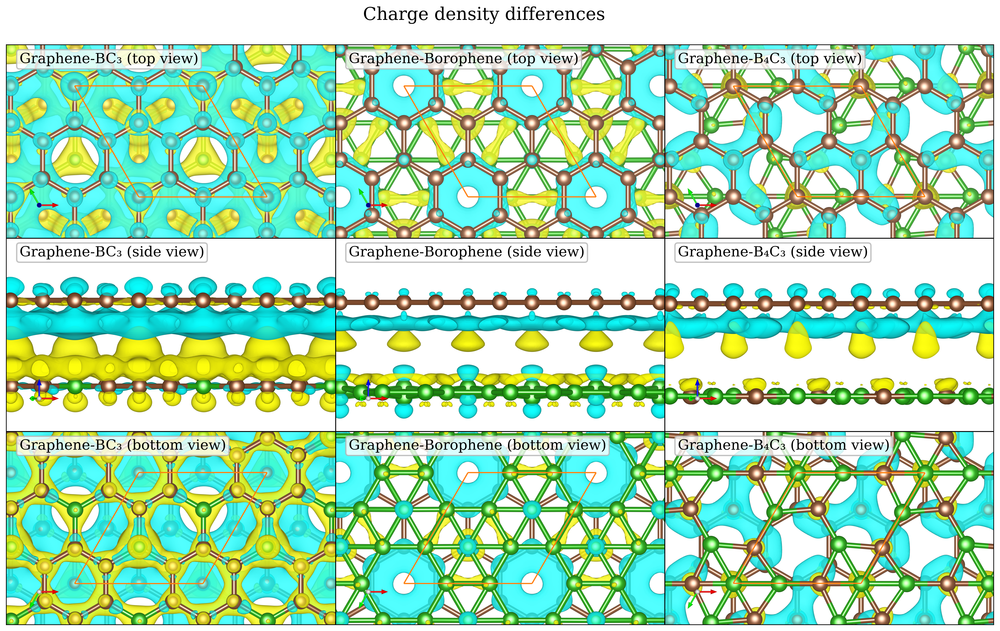

In [2]:
from PIL import Image
import matplotlib.pyplot as plt

from vmatplot.output import canvas_setting, color_sampling

def merge_6_rasters(image_paths, suptitle=None):
    # Figure setting
    fig_setting = canvas_setting()
    annotate_color= color_sampling("Grey")

    # Load images
    images = [Image.open(image) for image in image_paths]

    # Use the first image's size
    # width, height = images[0].size
    # Use the last image's size
    width_source, height_source = images[-1].size
    
    scaling = 1
    width = width_source // scaling
    height = height_source // scaling

    # Create a new image to merge the four images
    result = Image.new("RGB", (3 * width, 3 * height))

    # Paste the images into the new image
    result.paste(images[0], (0, 0))
    result.paste(images[1], (0, height))
    result.paste(images[2], (0, 2 * height))
    result.paste(images[3], (width, 0))
    result.paste(images[4], (width, height))
    result.paste(images[5], (width, 2 * height))
    result.paste(images[6], (2 * width, 0))
    result.paste(images[7], (2 * width, height))
    result.paste(images[8], (2 * width, 2 * height))

    # Create a matplotlib figure
    _, ax = plt.subplots(figsize=(fig_setting[0][0]*2,fig_setting[0][1]*2), dpi=fig_setting[1]*1.5)
    params = fig_setting[2]; plt.rcParams.update(params)
    ax.tick_params(direction="in", which="both", top=True, right=True, bottom=True, left=True)
    ax.imshow(result)

    # Set ticks at the junctions of the images
    plt.xticks([width-0.5,2*width-0.5],["",""])     # Horizontal junction
    plt.yticks([height-0.5,2*height-0.5],["",""])   # Vertical junction

    # Dividing lines
    line_color = "black"
    plt.axhline(y=1 * height, color=line_color, linewidth=1)
    plt.axhline(y=2 * height, color=line_color, linewidth=1)
    plt.axvline(x=1 * width, color=line_color, linewidth=1)
    plt.axvline(x=2 * width, color=line_color, linewidth=1)

    # Add labels to each image
    # labels = ["a1","a2","a3","b1", "b2", "b3", "c1", "c2", "c3"]
    # labels = ["Graphene-BC₃ (side view)","Graphene-BC₃ (top view)","Graphene-BC₃ (bottom view)",
    #           "Graphene-Borophene (side view)","Graphene-Borophene (top view)","Graphene-Borophene (bottom view)",
    #           "Graphene-B₄C₃ (side view)","Graphene-B₄C₃ (top view)","Graphene-B₄C₃ (bottom view)"]
    labels = ["Graphene-BC₃ (top view)","Graphene-BC₃ (side view)","Graphene-BC₃ (bottom view)",
              "Graphene-Borophene (top view)","Graphene-Borophene (side view)","Graphene-Borophene (bottom view)",
              "Graphene-B₄C₃ (top view)","Graphene-B₄C₃ (side view)","Graphene-B₄C₃ (bottom view)"]

    for i, label in enumerate(labels):
        variable_x = i//3 * width + width * (0.080/2)
        variable_y = (2-(i%3)) * height + height * (1-0.075)

        ax.annotate(f"{label}",
                    xy=(variable_x / (3 * width), variable_y / (3 * height)),
                    # xy=(variable_x, variable_y),
                    xycoords="axes fraction",
                    fontsize=1.0 * 16,
                    ha="left", va="center",
                    bbox = {"facecolor": "white", "alpha": 0.80, "edgecolor": annotate_color[2], "linewidth": 1.5, "boxstyle": "round, pad=0.2"}, zorder=5)

    if suptitle:
        plt.suptitle(suptitle, fontsize=20, y=0.925)

    plt.show()

difference_path = [
                   "2_Structure_and_CDD/E_Graphene-BC3_top1.png",
                   "2_Structure_and_CDD/E_Graphene-BC3_side1a.png",
                   "2_Structure_and_CDD/E_Graphene-BC3_bottom1.png",

                   "2_Structure_and_CDD/F_Graphene-Borophene_top1.png",
                   "2_Structure_and_CDD/F_Graphene-Borophene_side1a.png",
                   "2_Structure_and_CDD/F_Graphene-Borophene_bottom1.png",

                   "2_Structure_and_CDD/G_Graphene-B4C3_top1.png",
                   "2_Structure_and_CDD/G_Graphene-B4C3_side1a.png",
                   "2_Structure_and_CDD/G_Graphene-B4C3_bottom1.png",
                   ]

merge_6_rasters(difference_path, "Charge density differences")
